In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.signal import savgol_filter
import umap
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
import torch.optim as optim

import pandas as pd
import IPython.display as ipd
import seaborn as sns
from einops import reduce
from pprint import pprint
from tqdm import tqdm

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [4]:
import gc
import sys
import os
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "max_split_size_mb:512"
os.chdir('../../')
os.getcwd()

'/home/bunny/projects/IConNet'

In [5]:
from IConNet.acov.audio_vqvae import VqVaeClsLoss
from IConNet.trainer.train_torch import get_dataloader
from IConNet.trainer.train_torch import Trainer_SCB10 as Trainer
from IConNet.acov.model import SCB7 as SCB
from omegaconf import OmegaConf as ocf

from IConNet.acov.visualize import (
    visualize_speech_codebook, get_embedding_color, 
    visualize_embedding_umap, visualize_training_curves,
    get_embedding_color_v2, get_zcs_color_v2
)

In [6]:
dataset_name = 'meld'
experiment_prefix = "scb7"
log_dir = f'../{experiment_prefix}_models/{dataset_name}/run_from_scratch/'
data_dir = "../data/data_preprocessed/"
dataset_config_path = f'config/dataset/{dataset_name}4.yaml'
dataset_config = ocf.load(dataset_config_path)
print(dataset_config)
batch_size = 2

{'name': 'meld', 'dataset_class': 'WaveformDataset', 'root': 'meld/', 'audio_dir': 'full_release/', 'feature_dir': 'features_4balanced/', 'label_name': 'label_emotion', 'feature_name': 'audio16k', 'num_classes': 4, 'label_values': [0, 1, 2, 3], 'classnames': ['neu', 'hap', 'sad', 'ang'], 'target_labels': ['ang', 'neu', 'sad', 'hap']}


In [7]:
train_loader, test_loader, batch_size = get_dataloader(
    dataset_config, data_dir, batch_size=batch_size)

In [8]:
loss_ratio=VqVaeClsLoss(perplexity=0, loss_vq=1, loss_recon=1, loss_cls=0.15)
trainer = Trainer(batch_size=batch_size, log_dir=log_dir, 
                  experiment_prefix=experiment_prefix, device=device,
                 accumulate_grad_batches=8)
trainer.prepare(train_loader=train_loader, 
                test_loader=test_loader, 
                batch_size=batch_size,
               loss_ratio=loss_ratio)

In [9]:
in_channels = 1
out_channels = 8
embedding_dim = 511
num_embeddings = 384
commitment_cost = 0.25
learning_rate = 1e-4
num_tokens = 256
num_classes = 4

In [10]:
model = SCB(
    in_channels=in_channels,
    out_channels=out_channels,
    num_embeddings=num_embeddings, 
    embedding_dim=embedding_dim, 
    num_tokens=num_tokens,
    num_classes=num_classes, 
    cls_dim=embedding_dim,
    sample_rate=16000,
    commitment_cost=commitment_cost,
    distance_type='euclidean',
    codebook_pretrained_path=None,
    freeze_codebook=False,
    loss_type='signal_loss',
)

In [11]:
trainer.setup(model=model, lr=learning_rate)

In [12]:
trainer.fit(
    n_epoch=20, lr=learning_rate, self_supervised=True, 
    train_task='embedding', test_n_epoch=None)

  3%|█▎                                                    | 0.5001471020888442/20 [08:23<5:26:01, 1003.18s/it]

Epoch: 1	Loss: 14.251 [perplexity=10.375, loss_vq=14.053, loss_recon=0.198, loss_cls=0.000]	


  5%|██▋                                                    | 0.9999999999999886/20 [16:43<5:15:59, 997.89s/it]

Epoch: 1	Loss: 47.955 [perplexity=11.941, loss_vq=47.787, loss_recon=0.168, loss_cls=0.000]	


  8%|████▏                                                  | 1.500147102089021/20 [25:07<5:11:26, 1010.09s/it]

Epoch: 2	Loss: 3.277 [perplexity=12.338, loss_vq=3.062, loss_recon=0.214, loss_cls=0.000]	


 10%|█████▌                                                 | 2.000000000000354/20 [33:32<5:01:32, 1005.16s/it]

Epoch: 2	Loss: 10.490 [perplexity=5.657, loss_vq=10.300, loss_recon=0.191, loss_cls=0.000]	


 13%|██████▊                                               | 2.5001471020893864/20 [42:00<4:57:23, 1019.65s/it]

Epoch: 3	Loss: 3.479 [perplexity=16.000, loss_vq=3.297, loss_recon=0.182, loss_cls=0.000]	


 15%|████████                                              | 3.0000000000007194/20 [50:27<4:47:46, 1015.65s/it]

Epoch: 3	Loss: 36.861 [perplexity=14.672, loss_vq=36.703, loss_recon=0.158, loss_cls=0.000]	


 18%|█████████▋                                             | 3.500147102089752/20 [58:59<4:42:07, 1025.95s/it]

Epoch: 4	Loss: 3.531 [perplexity=7.493, loss_vq=3.336, loss_recon=0.195, loss_cls=0.000]	


 20%|██████████▍                                         | 4.0000000000010845/20 [1:07:31<4:30:32, 1014.56s/it]

Epoch: 4	Loss: 5.527 [perplexity=7.493, loss_vq=5.336, loss_recon=0.192, loss_cls=0.000]	


 23%|███████████▉                                         | 4.500147102089362/20 [1:16:08<4:26:45, 1032.60s/it]

Epoch: 5	Loss: 16.369 [perplexity=7.493, loss_vq=16.143, loss_recon=0.226, loss_cls=0.000]	


 25%|████████████▉                                       | 4.9999999999999405/20 [1:24:45<4:21:23, 1045.60s/it]

Epoch: 5	Loss: 1.668 [perplexity=5.657, loss_vq=1.510, loss_recon=0.158, loss_cls=0.000]	


 28%|██████████████▌                                      | 5.500147102088218/20 [1:33:26<4:10:02, 1034.68s/it]

Epoch: 6	Loss: 11.103 [perplexity=14.672, loss_vq=10.986, loss_recon=0.117, loss_cls=0.000]	


 30%|███████████████▌                                    | 5.9999999999987965/20 [1:42:06<4:03:42, 1044.49s/it]

Epoch: 6	Loss: 7.326 [perplexity=8.172, loss_vq=7.177, loss_recon=0.149, loss_cls=0.000]	


 33%|█████████████████▏                                   | 6.500147102087074/20 [1:50:50<3:57:47, 1056.87s/it]

Epoch: 7	Loss: 28.931 [perplexity=8.172, loss_vq=28.747, loss_recon=0.184, loss_cls=0.000]	


 35%|██████████████████▏                                 | 6.9999999999976525/20 [1:59:35<3:46:04, 1043.43s/it]

Epoch: 7	Loss: 9.574 [perplexity=13.021, loss_vq=9.376, loss_recon=0.198, loss_cls=0.000]	


 38%|████████████████████▎                                 | 7.50014710208593/20 [2:08:28<3:38:43, 1049.91s/it]

Epoch: 8	Loss: 3.461 [perplexity=8.172, loss_vq=3.277, loss_recon=0.184, loss_cls=0.000]	


 40%|█████████████████████▏                               | 7.999999999996509/20 [2:17:17<3:34:12, 1071.08s/it]

Epoch: 8	Loss: 5.521 [perplexity=11.941, loss_vq=5.369, loss_recon=0.153, loss_cls=0.000]	


 43%|██████████████████████▌                              | 8.500147102084787/20 [2:26:11<3:23:21, 1061.03s/it]

Epoch: 9	Loss: 8.723 [perplexity=9.676, loss_vq=8.536, loss_recon=0.187, loss_cls=0.000]	


 45%|███████████████████████▊                             | 8.999999999995365/20 [2:35:04<3:18:30, 1082.75s/it]

Epoch: 9	Loss: 6.000 [perplexity=5.187, loss_vq=5.766, loss_recon=0.233, loss_cls=0.000]	


 48%|█████████████████████████▏                           | 9.500147102083643/20 [2:44:00<3:09:02, 1080.24s/it]

Epoch: 10	Loss: 2.746 [perplexity=6.830, loss_vq=2.546, loss_recon=0.200, loss_cls=0.000]	


 50%|██████████████████████████▍                          | 9.999999999994222/20 [2:53:00<2:57:21, 1064.17s/it]

Epoch: 10	Loss: 8.706 [perplexity=14.672, loss_vq=8.562, loss_recon=0.144, loss_cls=0.000]	


 53%|███████████████████████████▎                        | 10.500147102082499/20 [3:02:02<2:54:54, 1104.66s/it]

Epoch: 11	Loss: 3.193 [perplexity=13.454, loss_vq=3.007, loss_recon=0.186, loss_cls=0.000]	


 55%|████████████████████████████▌                       | 10.999999999993078/20 [3:11:04<2:43:42, 1091.43s/it]

Epoch: 11	Loss: 8.035 [perplexity=16.000, loss_vq=7.945, loss_recon=0.090, loss_cls=0.000]	


 58%|█████████████████████████████▉                      | 11.500147102081355/20 [3:20:08<2:33:20, 1082.38s/it]

Epoch: 12	Loss: 35.508 [perplexity=6.830, loss_vq=35.401, loss_recon=0.107, loss_cls=0.000]	


 60%|███████████████████████████████▏                    | 11.999999999991934/20 [3:29:14<2:25:46, 1093.33s/it]

Epoch: 12	Loss: 4.319 [perplexity=8.172, loss_vq=4.153, loss_recon=0.166, loss_cls=0.000]	


 63%|████████████████████████████████▌                   | 12.500147102080211/20 [3:38:21<2:20:22, 1123.04s/it]

Epoch: 13	Loss: 4.119 [perplexity=7.875, loss_vq=3.998, loss_recon=0.120, loss_cls=0.000]	


 65%|██████████████████████████████████▍                  | 12.99999999999079/20 [3:47:32<2:07:55, 1096.44s/it]

Epoch: 13	Loss: 6.046 [perplexity=8.172, loss_vq=5.875, loss_recon=0.171, loss_cls=0.000]	


 68%|███████████████████████████████████                 | 13.500147102079067/20 [3:56:46<2:00:54, 1116.12s/it]

Epoch: 14	Loss: 6.283 [perplexity=8.172, loss_vq=6.130, loss_recon=0.153, loss_cls=0.000]	


 70%|████████████████████████████████████▍               | 13.999999999989646/20 [4:06:00<1:49:10, 1091.78s/it]

Epoch: 14	Loss: 11.727 [perplexity=5.657, loss_vq=11.560, loss_recon=0.167, loss_cls=0.000]	


 73%|█████████████████████████████████████▋              | 14.500147102077923/20 [4:15:16<1:42:40, 1120.20s/it]

Epoch: 15	Loss: 10.092 [perplexity=8.172, loss_vq=9.930, loss_recon=0.162, loss_cls=0.000]	


 74%|██████████████████████████████████████▎             | 14.714621947620484/20 [4:19:16<1:41:24, 1151.27s/it]Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7c5b84a111c0>>
Traceback (most recent call last):
  File "/home/bunny/anaconda3/envs/audio/lib/python3.9/site-packages/ipykernel/ipkernel.py", line 770, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 
Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7c5b84a111c0>>
Traceback (most recent call last):
  File "/home/bunny/anaconda3/envs/audio/lib/python3.9/site-packages/ipykernel/ipkernel.py", line 770, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 
 74%|██████████████████████████████████████▎             | 14.714916151798183/20 [4:19:17<1:33:07, 1057.25s/it]


RuntimeError: DataLoader worker (pid(s) 1208965, 1208981, 1208997, 1209013, 1209029, 1209045, 1209063, 1209079) exited unexpectedly

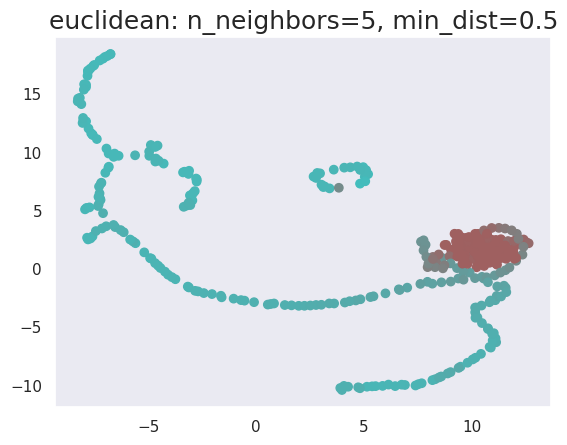

In [13]:
emb = model.embedding_filters.data.cpu()
emb_color, zcs = get_embedding_color_v2(emb)
k = 5
min_dist = 0.5
umap_metric = 'euclidean'
visualize_embedding_umap(emb, colors=emb_color, edgecolors=None,
          n_neighbors=k, min_dist=min_dist, metric=umap_metric, 
          title=f'{umap_metric}: n_neighbors={k}, min_dist={min_dist}')

In [14]:
torch.save(emb, log_dir + 'codebook.epoch=15.pt')

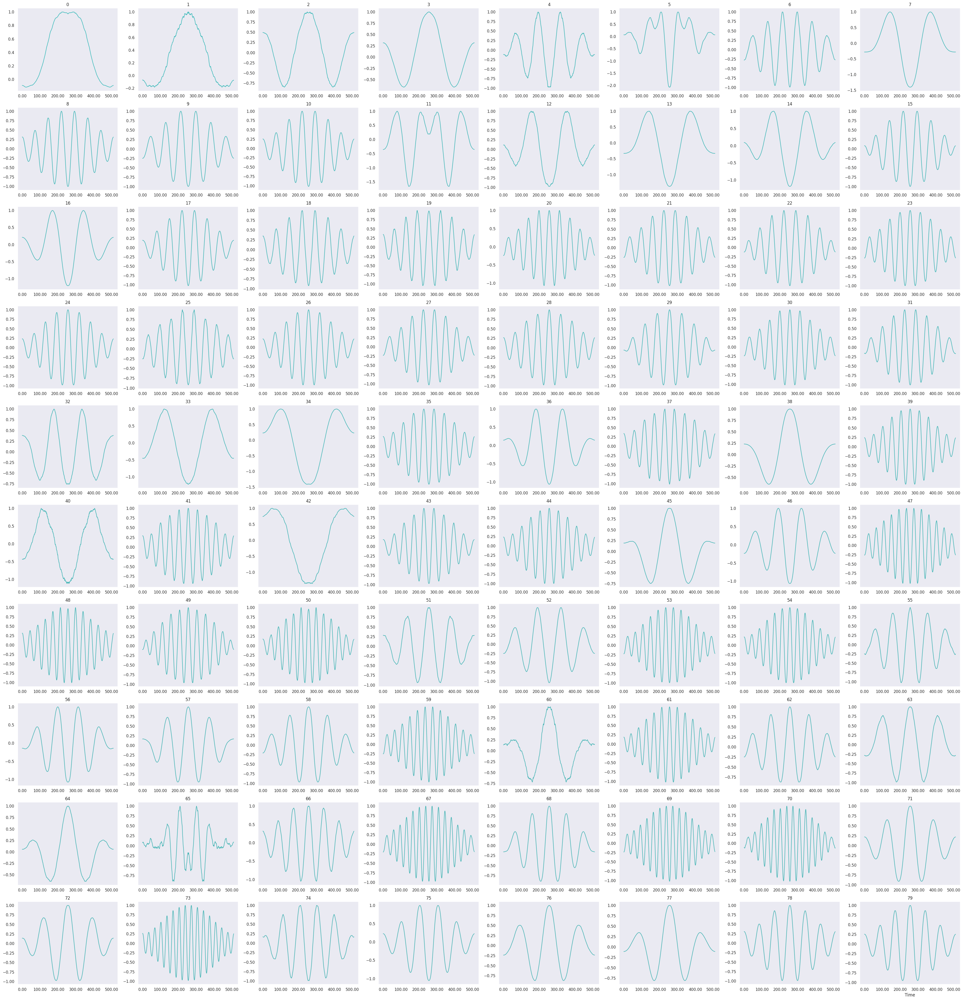

In [15]:
selected_emb_topk = torch.topk(zcs, 80)
selected_idx = selected_emb_topk.indices[-80:]
visualize_speech_codebook(
    emb[selected_idx].numpy(), 
    n=80, colors=emb_color[selected_idx], 
    feature_mel=False, waveplot_librosa=False)

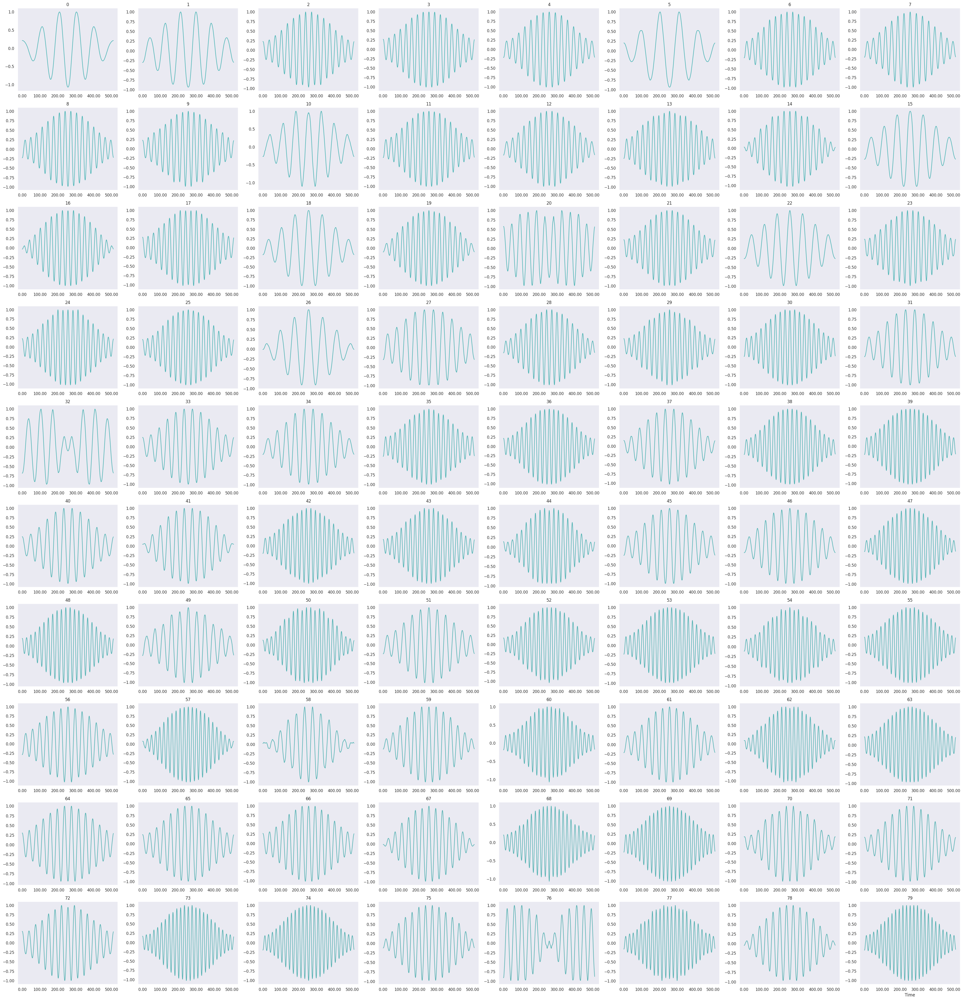

In [16]:
selected_emb_topk = torch.topk(zcs, 160)
selected_idx = selected_emb_topk.indices[-80:]
visualize_speech_codebook(
    emb[selected_idx].numpy(), 
    n=80, colors=emb_color[selected_idx], 
    feature_mel=False, waveplot_librosa=False)

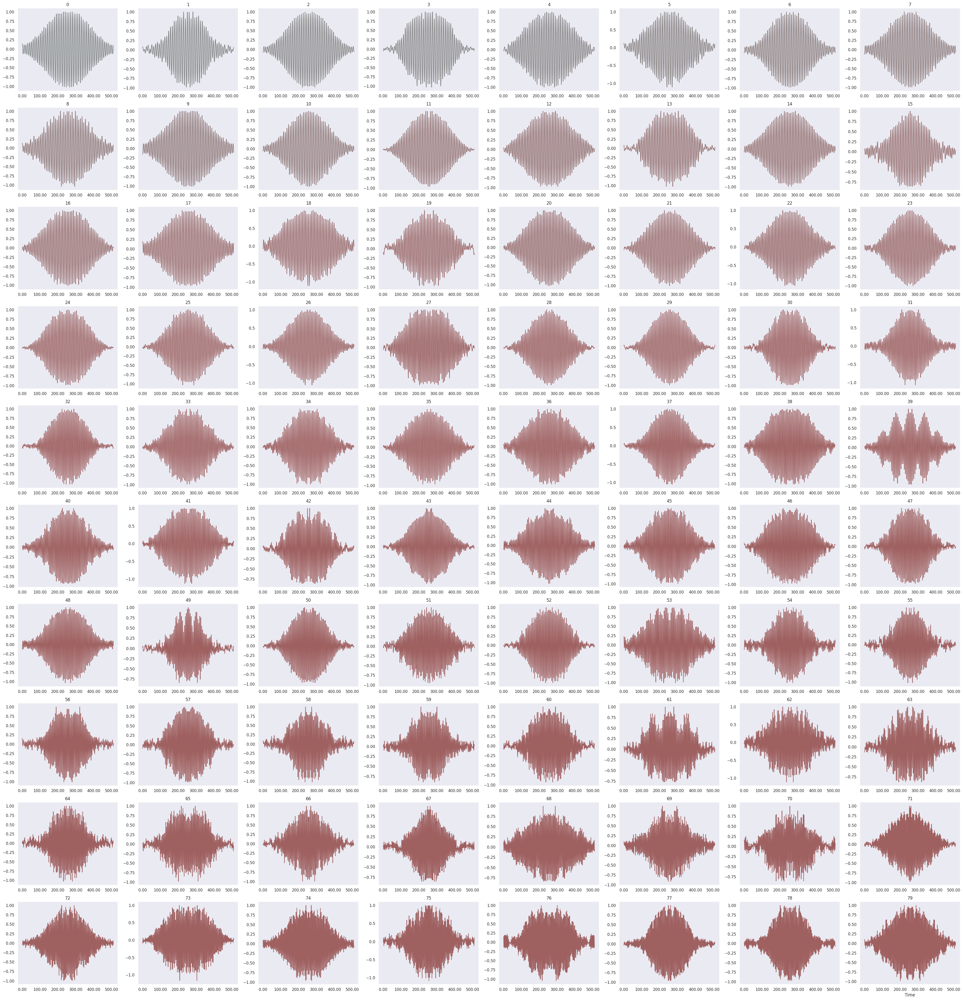

In [18]:
selected_emb_topk = torch.topk(zcs, 320)
selected_idx = selected_emb_topk.indices[-80:]
visualize_speech_codebook(
    emb[selected_idx].numpy(), 
    n=80, colors=emb_color[selected_idx], 
    feature_mel=False, waveplot_librosa=False)

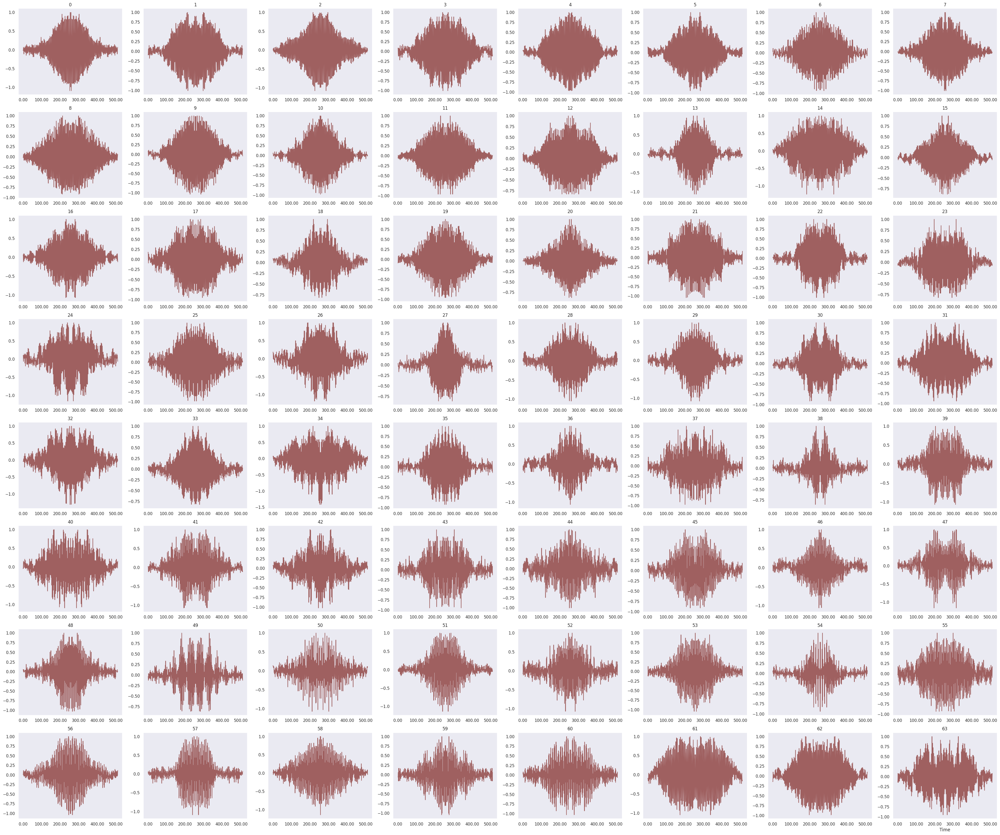

In [19]:
selected_emb_topk = torch.topk(zcs, 384)
selected_idx = selected_emb_topk.indices[-64:]
visualize_speech_codebook(
    emb[selected_idx].numpy(), 
    n=64, colors=emb_color[selected_idx], 
    feature_mel=False, waveplot_librosa=False)

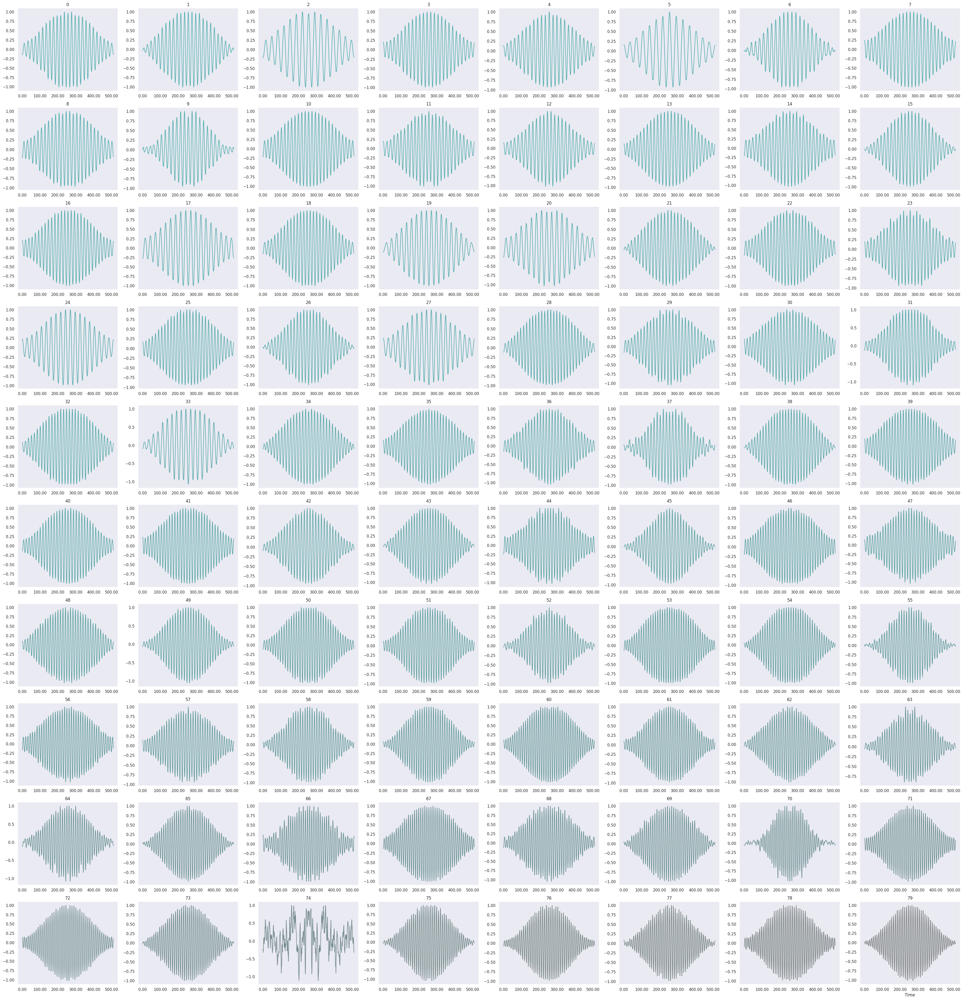

In [17]:
selected_emb_topk = torch.topk(zcs, 240)
selected_idx = selected_emb_topk.indices[-80:]
visualize_speech_codebook(
    emb[selected_idx].numpy(), 
    n=80, colors=emb_color[selected_idx], 
    feature_mel=False, waveplot_librosa=False)

In [20]:
trainer.fit(
    n_epoch=35, lr=learning_rate, self_supervised=False, 
    train_task='embedding', test_n_epoch=1)

  1%|▍                                               | 0.33339870562854323/35 [13:16<1070:24:42, 111158.35s/it]

Epoch: 16	Loss: 2.894 [perplexity=8.172, loss_vq=2.370, loss_recon=0.206, loss_cls=2.116]	Val_acc: 199/340 (58.53%)

Saved new best val model: ../scb7_models/meld/run_from_scratch/model.epoch=16.step=45249.loss=2.894.val_acc=0.585.pt


  2%|▉                                                | 0.6666012943714613/35 [26:31<1053:05:03, 110420.29s/it]

Epoch: 16	Loss: 7.451 [perplexity=8.172, loss_vq=7.111, loss_recon=0.121, loss_cls=1.460]	Val_acc: 203/340 (59.71%)

Saved new best val model: ../scb7_models/meld/run_from_scratch/model.epoch=16.step=46736.loss=7.451.val_acc=0.597.pt


  3%|█▌                                                   | 1.0000000000000904/35 [37:31<18:33:43, 1965.39s/it]

Correct: 939/1700 (0.5524)
Saved new best test model: ../scb7_models/meld/run_from_scratch/model.epoch=16.step=46736.test_acc=0.5524.pt
{'acc_unweighted': tensor(0.2759, device='cuda:0'),
 'acc_weighted': tensor(0.5524, device='cuda:0'),
 'f1s_unweighted': tensor(0.2289, device='cuda:0'),
 'f1s_weighted': tensor(0.4224, device='cuda:0'),
 'rocauc': tensor(0.5735, device='cuda:0'),
 'uar': tensor(0.2759, device='cuda:0'),
 'wap': tensor(0.3682, device='cuda:0')}
{'acc_detail': tensor([0.1401, 0.9637, 0.0000, 0.0000], device='cuda:0'),
 'f1s_detail': tensor([0.2057, 0.7099, 0.0000, 0.0000], device='cuda:0'),
 'precision_detail': tensor([0.3871, 0.5619, 0.0000, 0.0000], device='cuda:0'),
 'recall_detail': tensor([0.1401, 0.9637, 0.0000, 0.0000], device='cuda:0'),
 'rocauc_detail': tensor([0.6757, 0.5964, 0.5189, 0.5032], device='cuda:0')}
tensor([[ 36, 221,   0,   0],
        [ 34, 903,   0,   0],
        [ 10, 151,   0,   0],
        [ 13, 332,   0,   0]], device='cuda:0')


  4%|█▊                                               | 1.3333987056287195/35 [51:00<1051:14:38, 112410.47s/it]

Epoch: 17	Loss: 4.280 [perplexity=10.375, loss_vq=3.891, loss_recon=0.141, loss_cls=1.651]	Val_acc: 198/340 (58.24%)



  5%|██▏                                            | 1.6666012943716848/35 [1:04:31<1042:17:47, 112567.80s/it]

Epoch: 17	Loss: 8.070 [perplexity=8.172, loss_vq=7.650, loss_recon=0.122, loss_cls=1.986]	Val_acc: 197/340 (57.94%)



  6%|██▉                                                 | 2.000000000000314/35 [1:15:44<18:32:12, 2022.20s/it]

Correct: 910/1700 (0.5353)
{'acc_unweighted': tensor(0.2487, device='cuda:0'),
 'acc_weighted': tensor(0.5353, device='cuda:0'),
 'f1s_unweighted': tensor(0.1912, device='cuda:0'),
 'f1s_weighted': tensor(0.4011, device='cuda:0'),
 'rocauc': tensor(0.5524, device='cuda:0'),
 'uar': tensor(0.2487, device='cuda:0'),
 'wap': tensor(0.3357, device='cuda:0')}
{'acc_detail': tensor([0.0000, 0.9573, 0.0000, 0.0377], device='cuda:0'),
 'f1s_detail': tensor([0.0000, 0.7060, 0.0000, 0.0590], device='cuda:0'),
 'precision_detail': tensor([0.0000, 0.5592, 0.0000, 0.1354], device='cuda:0'),
 'recall_detail': tensor([0.0000, 0.9573, 0.0000, 0.0377], device='cuda:0'),
 'rocauc_detail': tensor([0.6146, 0.5377, 0.5596, 0.4975], device='cuda:0')}
tensor([[  0, 215,   0,  42],
        [  0, 897,   0,  40],
        [  0, 160,   0,   1],
        [  0, 332,   0,  13]], device='cuda:0')


  7%|███▏                                           | 2.3333987056285657/35 [1:29:17<1030:43:53, 113591.06s/it]

Epoch: 18	Loss: 2.486 [perplexity=6.830, loss_vq=2.037, loss_recon=0.183, loss_cls=1.773]	Val_acc: 199/340 (58.53%)



  8%|███▌                                           | 2.6666012943711537/35 [1:42:53<1020:42:02, 113644.80s/it]

Epoch: 18	Loss: 17.250 [perplexity=13.021, loss_vq=16.894, loss_recon=0.145, loss_cls=1.405]	Val_acc: 203/340 (59.71%)



  9%|████▎                                              | 2.9999999999994054/35 [1:54:10<18:13:06, 2049.59s/it]

Correct: 930/1700 (0.5471)
{'acc_unweighted': tensor(0.2827, device='cuda:0'),
 'acc_weighted': tensor(0.5471, device='cuda:0'),
 'f1s_unweighted': tensor(0.2372, device='cuda:0'),
 'f1s_weighted': tensor(0.4270, device='cuda:0'),
 'rocauc': tensor(0.5692, device='cuda:0'),
 'uar': tensor(0.2827, device='cuda:0'),
 'wap': tensor(0.3624, device='cuda:0')}
{'acc_detail': tensor([0.1907, 0.9402, 0.0000, 0.0000], device='cuda:0'),
 'f1s_detail': tensor([0.2396, 0.7091, 0.0000, 0.0000], device='cuda:0'),
 'precision_detail': tensor([0.3224, 0.5691, 0.0000, 0.0000], device='cuda:0'),
 'recall_detail': tensor([0.1907, 0.9402, 0.0000, 0.0000], device='cuda:0'),
 'rocauc_detail': tensor([0.6522, 0.5875, 0.5188, 0.5183], device='cuda:0')}
tensor([[ 49, 208,   0,   0],
        [ 56, 881,   0,   0],
        [ 15, 146,   0,   0],
        [ 32, 313,   0,   0]], device='cuda:0')


 10%|████▌                                           | 3.333398705627657/35 [2:07:50<1012:21:03, 115088.57s/it]

Epoch: 19	Loss: 7.149 [perplexity=9.676, loss_vq=6.781, loss_recon=0.120, loss_cls=1.653]	Val_acc: 192/340 (56.47%)



 10%|█████▏                                           | 3.666601294370245/35 [2:21:34<996:58:09, 114545.17s/it]

Epoch: 19	Loss: 4.209 [perplexity=6.872, loss_vq=3.943, loss_recon=0.187, loss_cls=0.525]	Val_acc: 198/340 (58.24%)



 11%|█████▊                                             | 3.9999999999984968/35 [2:32:56<18:41:09, 2169.99s/it]

Correct: 940/1700 (0.5529)
Saved new best test model: ../scb7_models/meld/run_from_scratch/model.epoch=19.step=55658.test_acc=0.5529.pt
{'acc_unweighted': tensor(0.2536, device='cuda:0'),
 'acc_weighted': tensor(0.5529, device='cuda:0'),
 'f1s_unweighted': tensor(0.1855, device='cuda:0'),
 'f1s_weighted': tensor(0.3968, device='cuda:0'),
 'rocauc': tensor(0.5346, device='cuda:0'),
 'uar': tensor(0.2536, device='cuda:0'),
 'wap': tensor(0.4053, device='cuda:0')}
{'acc_detail': tensor([0.0156, 0.9989, 0.0000, 0.0000], device='cuda:0'),
 'f1s_detail': tensor([0.0304, 0.7115, 0.0000, 0.0000], device='cuda:0'),
 'precision_detail': tensor([0.6667, 0.5525, 0.0000, 0.0000], device='cuda:0'),
 'recall_detail': tensor([0.0156, 0.9989, 0.0000, 0.0000], device='cuda:0'),
 'rocauc_detail': tensor([0.6009, 0.5598, 0.4829, 0.4948], device='cuda:0')}
tensor([[  4, 253,   0,   0],
        [  1, 936,   0,   0],
        [  1, 160,   0,   0],
        [  0, 345,   0,   0]], device='cuda:0')


 12%|██████                                           | 4.333398705626749/35 [2:46:40<974:27:17, 114392.78s/it]

Epoch: 20	Loss: 9.746 [perplexity=11.314, loss_vq=9.449, loss_recon=0.159, loss_cls=0.922]	Val_acc: 196/340 (57.65%)



 13%|██████▌                                          | 4.666601294369337/35 [3:00:24<969:51:49, 115104.45s/it]

Epoch: 20	Loss: 7.163 [perplexity=13.021, loss_vq=6.840, loss_recon=0.164, loss_cls=1.061]	Val_acc: 199/340 (58.53%)



 14%|███████▍                                            | 4.999999999997589/35 [3:11:50<17:16:29, 2072.98s/it]

Correct: 943/1700 (0.5547)
Saved new best test model: ../scb7_models/meld/run_from_scratch/model.epoch=20.step=58632.test_acc=0.5547.pt
{'acc_unweighted': tensor(0.2558, device='cuda:0'),
 'acc_weighted': tensor(0.5547, device='cuda:0'),
 'f1s_unweighted': tensor(0.1895, device='cuda:0'),
 'f1s_weighted': tensor(0.3996, device='cuda:0'),
 'rocauc': tensor(0.5382, device='cuda:0'),
 'uar': tensor(0.2558, device='cuda:0'),
 'wap': tensor(0.4346, device='cuda:0')}
{'acc_detail': tensor([0.0233, 1.0000, 0.0000, 0.0000], device='cuda:0'),
 'f1s_detail': tensor([0.0455, 0.7125, 0.0000, 0.0000], device='cuda:0'),
 'precision_detail': tensor([0.8571, 0.5535, 0.0000, 0.0000], device='cuda:0'),
 'recall_detail': tensor([0.0233, 1.0000, 0.0000, 0.0000], device='cuda:0'),
 'rocauc_detail': tensor([0.5774, 0.5516, 0.5193, 0.5046], device='cuda:0')}
tensor([[  6, 251,   0,   0],
        [  0, 937,   0,   0],
        [  1, 160,   0,   0],
        [  0, 345,   0,   0]], device='cuda:0')


 15%|███████▌                                          | 5.33339870562584/35 [3:25:37<946:31:44, 114859.95s/it]

Epoch: 21	Loss: 3.597 [perplexity=7.493, loss_vq=3.323, loss_recon=0.175, loss_cls=0.655]	Val_acc: 201/340 (59.12%)



 16%|███████▉                                         | 5.666601294368428/35 [3:39:28<936:41:28, 114957.29s/it]

Epoch: 21	Loss: 1.904 [perplexity=4.757, loss_vq=1.617, loss_recon=0.206, loss_cls=0.542]	Val_acc: 200/340 (58.82%)



 17%|█████████                                            | 5.99999999999668/35 [3:50:57<16:39:53, 2068.75s/it]

Correct: 948/1700 (0.5576)
Saved new best test model: ../scb7_models/meld/run_from_scratch/model.epoch=21.step=61606.test_acc=0.5576.pt
{'acc_unweighted': tensor(0.2614, device='cuda:0'),
 'acc_weighted': tensor(0.5576, device='cuda:0'),
 'f1s_unweighted': tensor(0.2005, device='cuda:0'),
 'f1s_weighted': tensor(0.4070, device='cuda:0'),
 'rocauc': tensor(0.5444, device='cuda:0'),
 'uar': tensor(0.2614, device='cuda:0'),
 'wap': tensor(0.4197, device='cuda:0')}
{'acc_detail': tensor([0.0467, 0.9989, 0.0000, 0.0000], device='cuda:0'),
 'f1s_detail': tensor([0.0879, 0.7142, 0.0000, 0.0000], device='cuda:0'),
 'precision_detail': tensor([0.7500, 0.5558, 0.0000, 0.0000], device='cuda:0'),
 'recall_detail': tensor([0.0467, 0.9989, 0.0000, 0.0000], device='cuda:0'),
 'rocauc_detail': tensor([0.6170, 0.5522, 0.5241, 0.4842], device='cuda:0')}
tensor([[ 12, 245,   0,   0],
        [  1, 936,   0,   0],
        [  2, 159,   0,   0],
        [  1, 344,   0,   0]], device='cuda:0')


 18%|████████▊                                        | 6.333398705624932/35 [4:04:50<929:38:04, 116745.06s/it]

Epoch: 22	Loss: 4.335 [perplexity=11.941, loss_vq=3.981, loss_recon=0.174, loss_cls=1.201]	Val_acc: 198/340 (58.24%)



 19%|█████████▌                                        | 6.66660129436752/35 [4:18:41<915:48:33, 116361.37s/it]

Epoch: 22	Loss: 5.562 [perplexity=8.172, loss_vq=5.264, loss_recon=0.212, loss_cls=0.571]	Val_acc: 201/340 (59.12%)



 20%|██████████▍                                         | 6.999999999995771/35 [4:30:17<16:25:59, 2112.83s/it]

Correct: 940/1700 (0.5529)
{'acc_unweighted': tensor(0.2601, device='cuda:0'),
 'acc_weighted': tensor(0.5529, device='cuda:0'),
 'f1s_unweighted': tensor(0.2038, device='cuda:0'),
 'f1s_weighted': tensor(0.4109, device='cuda:0'),
 'rocauc': tensor(0.5690, device='cuda:0'),
 'uar': tensor(0.2601, device='cuda:0'),
 'wap': tensor(0.4621, device='cuda:0')}
{'acc_detail': tensor([0.0311, 0.9861, 0.0000, 0.0232], device='cuda:0'),
 'f1s_detail': tensor([0.0597, 0.7138, 0.0000, 0.0419], device='cuda:0'),
 'precision_detail': tensor([0.7273, 0.5593, 0.0000, 0.2162], device='cuda:0'),
 'recall_detail': tensor([0.0311, 0.9861, 0.0000, 0.0232], device='cuda:0'),
 'rocauc_detail': tensor([0.6454, 0.5813, 0.5208, 0.5284], device='cuda:0')}
tensor([[  8, 235,   0,  14],
        [  2, 924,   0,  11],
        [  0, 157,   0,   4],
        [  1, 336,   0,   8]], device='cuda:0')


 21%|██████████▎                                      | 7.333398705624023/35 [4:44:18<900:57:55, 117234.34s/it]

Epoch: 23	Loss: 3.044 [perplexity=5.657, loss_vq=2.656, loss_recon=0.163, loss_cls=1.502]	Val_acc: 199/340 (58.53%)



 22%|██████████▋                                      | 7.666601294366611/35 [4:58:18<890:23:47, 117271.47s/it]

Epoch: 23	Loss: 5.073 [perplexity=6.830, loss_vq=4.830, loss_recon=0.149, loss_cls=0.635]	Val_acc: 197/340 (57.94%)



 23%|███████████▉                                        | 7.999999999994863/35 [5:09:59<15:55:25, 2123.15s/it]

Correct: 944/1700 (0.5553)
{'acc_unweighted': tensor(0.2572, device='cuda:0'),
 'acc_weighted': tensor(0.5553, device='cuda:0'),
 'f1s_unweighted': tensor(0.1941, device='cuda:0'),
 'f1s_weighted': tensor(0.4053, device='cuda:0'),
 'rocauc': tensor(0.5501, device='cuda:0'),
 'uar': tensor(0.2572, device='cuda:0'),
 'wap': tensor(0.4330, device='cuda:0')}
{'acc_detail': tensor([0.0195, 0.9979, 0.0000, 0.0116], device='cuda:0'),
 'f1s_detail': tensor([0.0376, 0.7170, 0.0000, 0.0219], device='cuda:0'),
 'precision_detail': tensor([0.5556, 0.5595, 0.0000, 0.2000], device='cuda:0'),
 'recall_detail': tensor([0.0195, 0.9979, 0.0000, 0.0116], device='cuda:0'),
 'rocauc_detail': tensor([0.6032, 0.5713, 0.4890, 0.5370], device='cuda:0')}
tensor([[  5, 241,   0,  11],
        [  0, 935,   0,   2],
        [  0, 158,   0,   3],
        [  4, 337,   0,   4]], device='cuda:0')


 24%|███████████▋                                     | 8.333398705624624/35 [5:24:05<871:02:49, 117591.65s/it]

Epoch: 24	Loss: 6.777 [perplexity=8.873, loss_vq=6.587, loss_recon=0.130, loss_cls=0.403]	Val_acc: 204/340 (60.00%)

Saved new best val model: ../scb7_models/meld/run_from_scratch/model.epoch=24.step=69041.loss=6.777.val_acc=0.600.pt


 25%|████████████▏                                    | 8.666601294368721/35 [5:38:07<861:55:21, 117832.15s/it]

Epoch: 24	Loss: 7.894 [perplexity=4.649, loss_vq=7.558, loss_recon=0.162, loss_cls=1.162]	Val_acc: 197/340 (57.94%)



 26%|█████████████▎                                      | 8.999999999998483/35 [5:49:49<15:09:21, 2098.51s/it]

Correct: 927/1700 (0.5453)
{'acc_unweighted': tensor(0.2932, device='cuda:0'),
 'acc_weighted': tensor(0.5453, device='cuda:0'),
 'f1s_unweighted': tensor(0.2472, device='cuda:0'),
 'f1s_weighted': tensor(0.4336, device='cuda:0'),
 'rocauc': tensor(0.5620, device='cuda:0'),
 'uar': tensor(0.2932, device='cuda:0'),
 'wap': tensor(0.3657, device='cuda:0')}
{'acc_detail': tensor([0.2529, 0.9200, 0.0000, 0.0000], device='cuda:0'),
 'f1s_detail': tensor([0.2784, 0.7103, 0.0000, 0.0000], device='cuda:0'),
 'precision_detail': tensor([0.3095, 0.5785, 0.0000, 0.0000], device='cuda:0'),
 'recall_detail': tensor([0.2529, 0.9200, 0.0000, 0.0000], device='cuda:0'),
 'rocauc_detail': tensor([0.6597, 0.5929, 0.4727, 0.5227], device='cuda:0')}
tensor([[ 65, 192,   0,   0],
        [ 75, 862,   0,   0],
        [ 23, 138,   0,   0],
        [ 47, 298,   0,   0]], device='cuda:0')


 27%|█████████████                                    | 9.333398705628245/35 [6:03:57<843:05:57, 118253.20s/it]

Epoch: 25	Loss: 4.682 [perplexity=6.263, loss_vq=4.383, loss_recon=0.132, loss_cls=1.110]	Val_acc: 197/340 (57.94%)



 28%|█████████████▌                                   | 9.666601294372342/35 [6:18:05<836:53:46, 118927.04s/it]

Epoch: 25	Loss: 6.190 [perplexity=6.263, loss_vq=5.580, loss_recon=0.247, loss_cls=2.417]	Val_acc: 200/340 (58.82%)



 29%|██████████████▌                                    | 10.000000000002103/35 [6:29:53<14:52:44, 2142.57s/it]

Correct: 940/1700 (0.5529)
{'acc_unweighted': tensor(0.2689, device='cuda:0'),
 'acc_weighted': tensor(0.5529, device='cuda:0'),
 'f1s_unweighted': tensor(0.2217, device='cuda:0'),
 'f1s_weighted': tensor(0.4200, device='cuda:0'),
 'rocauc': tensor(0.5812, device='cuda:0'),
 'uar': tensor(0.2689, device='cuda:0'),
 'wap': tensor(0.4172, device='cuda:0')}
{'acc_detail': tensor([0.0895, 0.9744, 0.0000, 0.0116], device='cuda:0'),
 'f1s_detail': tensor([0.1533, 0.7122, 0.0000, 0.0213], device='cuda:0'),
 'precision_detail': tensor([0.5349, 0.5612, 0.0000, 0.1333], device='cuda:0'),
 'recall_detail': tensor([0.0895, 0.9744, 0.0000, 0.0116], device='cuda:0'),
 'rocauc_detail': tensor([0.6556, 0.6060, 0.5432, 0.5202], device='cuda:0')}
tensor([[ 23, 226,   0,   8],
        [  9, 913,   0,  15],
        [  2, 156,   0,   3],
        [  9, 332,   0,   4]], device='cuda:0')


 30%|██████████████▏                                 | 10.333398705631865/35 [6:44:07<814:01:12, 118803.27s/it]

Epoch: 26	Loss: 2.853 [perplexity=6.830, loss_vq=2.482, loss_recon=0.166, loss_cls=1.372]	Val_acc: 198/340 (58.24%)



 30%|██████████████▋                                 | 10.666601294375962/35 [6:58:20<805:05:49, 119109.95s/it]

Epoch: 26	Loss: 11.804 [perplexity=6.830, loss_vq=11.572, loss_recon=0.152, loss_cls=0.534]	Val_acc: 200/340 (58.82%)



 31%|████████████████                                   | 11.000000000005723/35 [7:10:15<14:26:16, 2165.68s/it]

Correct: 937/1700 (0.5512)
{'acc_unweighted': tensor(0.2825, device='cuda:0'),
 'acc_weighted': tensor(0.5512, device='cuda:0'),
 'f1s_unweighted': tensor(0.2376, device='cuda:0'),
 'f1s_weighted': tensor(0.4274, device='cuda:0'),
 'rocauc': tensor(0.5625, device='cuda:0'),
 'uar': tensor(0.2825, device='cuda:0'),
 'wap': tensor(0.3674, device='cuda:0')}
{'acc_detail': tensor([0.1790, 0.9509, 0.0000, 0.0000], device='cuda:0'),
 'f1s_detail': tensor([0.2408, 0.7094, 0.0000, 0.0000], device='cuda:0'),
 'precision_detail': tensor([0.3680, 0.5657, 0.0000, 0.0000], device='cuda:0'),
 'recall_detail': tensor([0.1790, 0.9509, 0.0000, 0.0000], device='cuda:0'),
 'rocauc_detail': tensor([0.6507, 0.5904, 0.4864, 0.5228], device='cuda:0')}
tensor([[ 46, 211,   0,   0],
        [ 46, 891,   0,   0],
        [ 12, 149,   0,   0],
        [ 21, 324,   0,   0]], device='cuda:0')


 32%|███████████████▌                                | 11.333398705635485/35 [7:24:32<786:08:47, 119583.17s/it]

Epoch: 27	Loss: 15.217 [perplexity=14.672, loss_vq=14.909, loss_recon=0.118, loss_cls=1.258]	Val_acc: 200/340 (58.82%)



 33%|███████████████▉                                | 11.666601294379582/35 [7:38:52<775:19:53, 119622.26s/it]

Epoch: 27	Loss: 3.321 [perplexity=7.493, loss_vq=2.977, loss_recon=0.129, loss_cls=1.433]	Val_acc: 200/340 (58.82%)



 34%|█████████████████▍                                 | 12.000000000009344/35 [7:50:48<13:48:13, 2160.59s/it]

Correct: 944/1700 (0.5553)
{'acc_unweighted': tensor(0.2730, device='cuda:0'),
 'acc_weighted': tensor(0.5553, device='cuda:0'),
 'f1s_unweighted': tensor(0.2238, device='cuda:0'),
 'f1s_weighted': tensor(0.4203, device='cuda:0'),
 'rocauc': tensor(0.5603, device='cuda:0'),
 'uar': tensor(0.2730, device='cuda:0'),
 'wap': tensor(0.3731, device='cuda:0')}
{'acc_detail': tensor([0.1167, 0.9755, 0.0000, 0.0000], device='cuda:0'),
 'f1s_detail': tensor([0.1829, 0.7124, 0.0000, 0.0000], device='cuda:0'),
 'precision_detail': tensor([0.4225, 0.5611, 0.0000, 0.0000], device='cuda:0'),
 'recall_detail': tensor([0.1167, 0.9755, 0.0000, 0.0000], device='cuda:0'),
 'rocauc_detail': tensor([0.6496, 0.5835, 0.4756, 0.5324], device='cuda:0')}
tensor([[ 30, 227,   0,   0],
        [ 23, 914,   0,   0],
        [  5, 156,   0,   0],
        [ 13, 332,   0,   0]], device='cuda:0')


 35%|████████████████▉                               | 12.333398705639105/35 [8:05:11<756:54:05, 120214.12s/it]

Epoch: 28	Loss: 18.304 [perplexity=14.672, loss_vq=17.996, loss_recon=0.157, loss_cls=1.007]	Val_acc: 201/340 (59.12%)



 36%|█████████████████▎                              | 12.666601294383202/35 [8:19:37<746:00:57, 120252.98s/it]

Epoch: 28	Loss: 2.175 [perplexity=3.794, loss_vq=1.791, loss_recon=0.188, loss_cls=1.303]	Val_acc: 198/340 (58.24%)



 37%|██████████████████▉                                | 13.000000000012964/35 [8:31:37<13:47:47, 2257.62s/it]

Correct: 938/1700 (0.5518)
{'acc_unweighted': tensor(0.2510, device='cuda:0'),
 'acc_weighted': tensor(0.5518, device='cuda:0'),
 'f1s_unweighted': tensor(0.1797, device='cuda:0'),
 'f1s_weighted': tensor(0.3930, device='cuda:0'),
 'rocauc': tensor(0.5421, device='cuda:0'),
 'uar': tensor(0.2510, device='cuda:0'),
 'wap': tensor(0.4552, device='cuda:0')}
{'acc_detail': tensor([0.0039, 1.0000, 0.0000, 0.0000], device='cuda:0'),
 'f1s_detail': tensor([0.0078, 0.7109, 0.0000, 0.0000], device='cuda:0'),
 'precision_detail': tensor([1.0000, 0.5515, 0.0000, 0.0000], device='cuda:0'),
 'recall_detail': tensor([0.0039, 1.0000, 0.0000, 0.0000], device='cuda:0'),
 'rocauc_detail': tensor([0.5726, 0.5590, 0.5159, 0.5210], device='cuda:0')}
tensor([[  1, 256,   0,   0],
        [  0, 937,   0,   0],
        [  0, 161,   0,   0],
        [  0, 345,   0,   0]], device='cuda:0')


 38%|██████████████████▎                             | 13.333398705642725/35 [8:46:06<727:56:40, 120951.17s/it]

Epoch: 29	Loss: 9.939 [perplexity=11.314, loss_vq=9.603, loss_recon=0.168, loss_cls=1.118]	Val_acc: 198/340 (58.24%)



 39%|██████████████████▋                             | 13.666601294386822/35 [9:00:34<718:02:14, 121168.42s/it]

Epoch: 29	Loss: 8.614 [perplexity=11.941, loss_vq=8.071, loss_recon=0.130, loss_cls=2.752]	Val_acc: 192/340 (56.47%)



 40%|████████████████████▍                              | 14.000000000016584/35 [9:12:41<12:43:19, 2180.95s/it]

Correct: 894/1700 (0.5259)
{'acc_unweighted': tensor(0.2772, device='cuda:0'),
 'acc_weighted': tensor(0.5259, device='cuda:0'),
 'f1s_unweighted': tensor(0.2390, device='cuda:0'),
 'f1s_weighted': tensor(0.4390, device='cuda:0'),
 'rocauc': tensor(0.5327, device='cuda:0'),
 'uar': tensor(0.2772, device='cuda:0'),
 'wap': tensor(0.4535, device='cuda:0')}
{'acc_detail': tensor([0.0039, 0.8645, 0.0000, 0.2406], device='cuda:0'),
 'f1s_detail': tensor([0.0077, 0.7047, 0.0000, 0.2438], device='cuda:0'),
 'precision_detail': tensor([0.5000, 0.5947, 0.0000, 0.2470], device='cuda:0'),
 'recall_detail': tensor([0.0039, 0.8645, 0.0000, 0.2406], device='cuda:0'),
 'rocauc_detail': tensor([0.5505, 0.5836, 0.4814, 0.5153], device='cuda:0')}
tensor([[  1, 161,   0,  95],
        [  0, 810,   0, 127],
        [  0, 130,   0,  31],
        [  1, 261,   0,  83]], device='cuda:0')


 41%|███████████████████▋                            | 14.333398705646346/35 [9:27:16<694:09:06, 120917.15s/it]

Epoch: 30	Loss: 2.490 [perplexity=3.077, loss_vq=2.074, loss_recon=0.183, loss_cls=1.557]	Val_acc: 202/340 (59.41%)



 42%|████████████████████                            | 14.666601294390443/35 [9:41:49<690:22:00, 122228.47s/it]

Epoch: 30	Loss: 6.553 [perplexity=6.301, loss_vq=6.219, loss_recon=0.111, loss_cls=1.484]	Val_acc: 197/340 (57.94%)



 43%|█████████████████████▊                             | 15.000000000020204/35 [9:53:59<12:16:03, 2208.19s/it]

Correct: 935/1700 (0.5500)
{'acc_unweighted': tensor(0.2717, device='cuda:0'),
 'acc_weighted': tensor(0.5500, device='cuda:0'),
 'f1s_unweighted': tensor(0.2286, device='cuda:0'),
 'f1s_weighted': tensor(0.4260, device='cuda:0'),
 'rocauc': tensor(0.5620, device='cuda:0'),
 'uar': tensor(0.2717, device='cuda:0'),
 'wap': tensor(0.4025, device='cuda:0')}
{'acc_detail': tensor([0.1051, 0.9616, 0.0000, 0.0203], device='cuda:0'),
 'f1s_detail': tensor([0.1636, 0.7148, 0.0000, 0.0361], device='cuda:0'),
 'precision_detail': tensor([0.3699, 0.5688, 0.0000, 0.1628], device='cuda:0'),
 'recall_detail': tensor([0.1051, 0.9616, 0.0000, 0.0203], device='cuda:0'),
 'rocauc_detail': tensor([0.6459, 0.5846, 0.4996, 0.5180], device='cuda:0')}
tensor([[ 27, 211,   0,  19],
        [ 23, 901,   0,  13],
        [  8, 149,   0,   4],
        [ 15, 323,   0,   7]], device='cuda:0')


 44%|████████████████████▌                          | 15.333398705649966/35 [10:08:38<663:49:45, 121514.90s/it]

Epoch: 31	Loss: 5.185 [perplexity=5.743, loss_vq=4.812, loss_recon=0.176, loss_cls=1.307]	Val_acc: 196/340 (57.65%)



 45%|█████████████████████                          | 15.666601294394063/35 [10:23:15<660:26:21, 122977.92s/it]

Epoch: 31	Loss: 2.976 [perplexity=4.649, loss_vq=2.626, loss_recon=0.129, loss_cls=1.470]	Val_acc: 201/340 (59.12%)



 46%|██████████████████████▊                           | 16.000000000023824/35 [10:35:32<11:47:12, 2233.29s/it]

Correct: 945/1700 (0.5559)
{'acc_unweighted': tensor(0.2719, device='cuda:0'),
 'acc_weighted': tensor(0.5559, device='cuda:0'),
 'f1s_unweighted': tensor(0.2217, device='cuda:0'),
 'f1s_weighted': tensor(0.4194, device='cuda:0'),
 'rocauc': tensor(0.5544, device='cuda:0'),
 'uar': tensor(0.2719, device='cuda:0'),
 'wap': tensor(0.3735, device='cuda:0')}
{'acc_detail': tensor([0.1089, 0.9787, 0.0000, 0.0000], device='cuda:0'),
 'f1s_detail': tensor([0.1734, 0.7133, 0.0000, 0.0000], device='cuda:0'),
 'precision_detail': tensor([0.4242, 0.5612, 0.0000, 0.0000], device='cuda:0'),
 'recall_detail': tensor([0.1089, 0.9787, 0.0000, 0.0000], device='cuda:0'),
 'rocauc_detail': tensor([0.6099, 0.5709, 0.5109, 0.5261], device='cuda:0')}
tensor([[ 28, 229,   0,   0],
        [ 20, 917,   0,   0],
        [  7, 154,   0,   0],
        [ 11, 334,   0,   0]], device='cuda:0')


 47%|█████████████████████▉                         | 16.333398705653586/35 [10:50:13<636:06:01, 122676.96s/it]

Epoch: 32	Loss: 10.049 [perplexity=13.021, loss_vq=9.694, loss_recon=0.138, loss_cls=1.449]	Val_acc: 200/340 (58.82%)



 48%|██████████████████████▍                        | 16.666601294397683/35 [11:04:59<633:54:09, 124474.97s/it]

Epoch: 32	Loss: 3.014 [perplexity=6.830, loss_vq=2.541, loss_recon=0.182, loss_cls=1.939]	Val_acc: 199/340 (58.53%)



 49%|████████████████████████▎                         | 17.000000000027445/35 [11:17:16<11:01:00, 2203.36s/it]

Correct: 934/1700 (0.5494)
{'acc_unweighted': tensor(0.2663, device='cuda:0'),
 'acc_weighted': tensor(0.5494, device='cuda:0'),
 'f1s_unweighted': tensor(0.2172, device='cuda:0'),
 'f1s_weighted': tensor(0.4175, device='cuda:0'),
 'rocauc': tensor(0.5669, device='cuda:0'),
 'uar': tensor(0.2663, device='cuda:0'),
 'wap': tensor(0.4131, device='cuda:0')}
{'acc_detail': tensor([0.0817, 0.9691, 0.0000, 0.0145], device='cuda:0'),
 'f1s_detail': tensor([0.1292, 0.7119, 0.0000, 0.0275], device='cuda:0'),
 'precision_detail': tensor([0.3088, 0.5626, 0.0000, 0.2778], device='cuda:0'),
 'recall_detail': tensor([0.0817, 0.9691, 0.0000, 0.0145], device='cuda:0'),
 'rocauc_detail': tensor([0.6330, 0.5905, 0.5071, 0.5369], device='cuda:0')}
tensor([[ 21, 228,   0,   8],
        [ 25, 908,   0,   4],
        [  7, 153,   0,   1],
        [ 15, 325,   0,   5]], device='cuda:0')


 50%|███████████████████████▎                       | 17.333398705657206/35 [11:32:05<605:06:39, 123306.08s/it]

Epoch: 33	Loss: 4.350 [perplexity=5.657, loss_vq=3.867, loss_recon=0.232, loss_cls=1.679]	Val_acc: 199/340 (58.53%)



 50%|███████████████████████▋                       | 17.666601294401303/35 [11:46:55<596:53:22, 123968.90s/it]

Epoch: 33	Loss: 16.698 [perplexity=9.514, loss_vq=16.298, loss_recon=0.132, loss_cls=1.784]	Val_acc: 199/340 (58.53%)



 51%|█████████████████████████▋                        | 18.000000000031065/35 [11:59:17<10:35:03, 2241.35s/it]

Correct: 942/1700 (0.5541)
{'acc_unweighted': tensor(0.2656, device='cuda:0'),
 'acc_weighted': tensor(0.5541, device='cuda:0'),
 'f1s_unweighted': tensor(0.2156, device='cuda:0'),
 'f1s_weighted': tensor(0.4185, device='cuda:0'),
 'rocauc': tensor(0.5567, device='cuda:0'),
 'uar': tensor(0.2656, device='cuda:0'),
 'wap': tensor(0.4378, device='cuda:0')}
{'acc_detail': tensor([0.0584, 0.9808, 0.0000, 0.0232], device='cuda:0'),
 'f1s_detail': tensor([0.1060, 0.7149, 0.0000, 0.0416], device='cuda:0'),
 'precision_detail': tensor([0.5769, 0.5624, 0.0000, 0.2000], device='cuda:0'),
 'recall_detail': tensor([0.0584, 0.9808, 0.0000, 0.0232], device='cuda:0'),
 'rocauc_detail': tensor([0.6097, 0.5811, 0.5118, 0.5244], device='cuda:0')}
tensor([[ 15, 225,   0,  17],
        [  6, 919,   0,  12],
        [  1, 157,   0,   3],
        [  4, 333,   0,   8]], device='cuda:0')


 52%|████████████████████████▌                      | 18.333398705660827/35 [12:14:10<575:38:54, 124340.53s/it]

Epoch: 34	Loss: 5.793 [perplexity=7.493, loss_vq=5.478, loss_recon=0.135, loss_cls=1.199]	Val_acc: 198/340 (58.24%)



 53%|█████████████████████████                      | 18.666601294404924/35 [12:29:04<569:29:25, 125519.82s/it]

Epoch: 34	Loss: 5.200 [perplexity=3.794, loss_vq=4.947, loss_recon=0.123, loss_cls=0.867]	Val_acc: 200/340 (58.82%)



 54%|███████████████████████████▋                       | 19.000000000034685/35 [12:41:32<9:59:27, 2247.96s/it]

Correct: 935/1700 (0.5500)
{'acc_unweighted': tensor(0.2755, device='cuda:0'),
 'acc_weighted': tensor(0.5500, device='cuda:0'),
 'f1s_unweighted': tensor(0.2410, device='cuda:0'),
 'f1s_weighted': tensor(0.4365, device='cuda:0'),
 'rocauc': tensor(0.5643, device='cuda:0'),
 'uar': tensor(0.2755, device='cuda:0'),
 'wap': tensor(0.4457, device='cuda:0')}
{'acc_detail': tensor([0.0778, 0.9488, 0.0000, 0.0754], device='cuda:0'),
 'f1s_detail': tensor([0.1356, 0.7118, 0.0000, 0.1166], device='cuda:0'),
 'precision_detail': tensor([0.5263, 0.5695, 0.0000, 0.2574], device='cuda:0'),
 'recall_detail': tensor([0.0778, 0.9488, 0.0000, 0.0754], device='cuda:0'),
 'rocauc_detail': tensor([0.6481, 0.5829, 0.5069, 0.5194], device='cuda:0')}
tensor([[ 20, 206,   0,  31],
        [ 10, 889,   0,  38],
        [  2, 153,   0,   6],
        [  6, 313,   0,  26]], device='cuda:0')


 55%|█████████████████████████▉                     | 19.333398705664447/35 [12:56:31<545:29:28, 125347.44s/it]

Epoch: 35	Loss: 5.892 [perplexity=10.375, loss_vq=5.477, loss_recon=0.147, loss_cls=1.788]	Val_acc: 200/340 (58.82%)



 56%|██████████████████████████▍                    | 19.666601294408544/35 [13:11:29<533:27:01, 125244.37s/it]

Epoch: 35	Loss: 21.722 [perplexity=8.873, loss_vq=21.506, loss_recon=0.135, loss_cls=0.546]	Val_acc: 200/340 (58.82%)



 57%|█████████████████████████████▏                     | 20.000000000038305/35 [13:24:02<9:29:18, 2277.23s/it]

Correct: 946/1700 (0.5565)
{'acc_unweighted': tensor(0.2667, device='cuda:0'),
 'acc_weighted': tensor(0.5565, device='cuda:0'),
 'f1s_unweighted': tensor(0.2150, device='cuda:0'),
 'f1s_weighted': tensor(0.4172, device='cuda:0'),
 'rocauc': tensor(0.5563, device='cuda:0'),
 'uar': tensor(0.2667, device='cuda:0'),
 'wap': tensor(0.4450, device='cuda:0')}
{'acc_detail': tensor([0.0661, 0.9861, 0.0000, 0.0145], device='cuda:0'),
 'f1s_detail': tensor([0.1181, 0.7143, 0.0000, 0.0275], device='cuda:0'),
 'precision_detail': tensor([0.5484, 0.5600, 0.0000, 0.2632], device='cuda:0'),
 'recall_detail': tensor([0.0661, 0.9861, 0.0000, 0.0145], device='cuda:0'),
 'rocauc_detail': tensor([0.6049, 0.5746, 0.5071, 0.5386], device='cuda:0')}
tensor([[ 17, 232,   0,   8],
        [  8, 924,   0,   5],
        [  3, 157,   0,   1],
        [  3, 337,   0,   5]], device='cuda:0')


 58%|███████████████████████████▎                   | 20.333398705668067/35 [13:39:07<511:11:25, 125474.54s/it]

Epoch: 36	Loss: 7.105 [perplexity=13.021, loss_vq=6.880, loss_recon=0.171, loss_cls=0.365]	Val_acc: 200/340 (58.82%)



 59%|███████████████████████████▊                   | 20.666601294412164/35 [13:54:09<500:00:29, 125582.89s/it]

Epoch: 36	Loss: 6.199 [perplexity=6.830, loss_vq=5.676, loss_recon=0.136, loss_cls=2.576]	Val_acc: 189/340 (55.59%)



 60%|██████████████████████████████▌                    | 21.000000000041926/35 [14:06:44<8:43:39, 2244.26s/it]

Correct: 909/1700 (0.5347)
{'acc_unweighted': tensor(0.2856, device='cuda:0'),
 'acc_weighted': tensor(0.5347, device='cuda:0'),
 'f1s_unweighted': tensor(0.2396, device='cuda:0'),
 'f1s_weighted': tensor(0.4251, device='cuda:0'),
 'rocauc': tensor(0.5554, device='cuda:0'),
 'uar': tensor(0.2856, device='cuda:0'),
 'wap': tensor(0.3577, device='cuda:0')}
{'acc_detail': tensor([0.2374, 0.9050, 0.0000, 0.0000], device='cuda:0'),
 'f1s_detail': tensor([0.2579, 0.7005, 0.0000, 0.0000], device='cuda:0'),
 'precision_detail': tensor([0.2824, 0.5714, 0.0000, 0.0000], device='cuda:0'),
 'recall_detail': tensor([0.2374, 0.9050, 0.0000, 0.0000], device='cuda:0'),
 'rocauc_detail': tensor([0.6187, 0.5775, 0.5319, 0.4936], device='cuda:0')}
tensor([[ 61, 196,   0,   0],
        [ 89, 848,   0,   0],
        [ 20, 141,   0,   0],
        [ 46, 299,   0,   0]], device='cuda:0')


 61%|████████████████████████████▋                  | 21.333398705671687/35 [14:21:51<479:08:22, 126213.01s/it]

Epoch: 37	Loss: 3.847 [perplexity=5.657, loss_vq=3.659, loss_recon=0.118, loss_cls=0.468]	Val_acc: 201/340 (59.12%)



 62%|█████████████████████████████                  | 21.666601294415784/35 [14:36:57<467:59:46, 126358.37s/it]

Epoch: 37	Loss: 18.027 [perplexity=12.338, loss_vq=17.706, loss_recon=0.153, loss_cls=1.120]	Val_acc: 198/340 (58.24%)



 63%|████████████████████████████████                   | 22.000000000045546/35 [14:49:38<8:16:53, 2293.34s/it]

Correct: 932/1700 (0.5482)
{'acc_unweighted': tensor(0.2792, device='cuda:0'),
 'acc_weighted': tensor(0.5482, device='cuda:0'),
 'f1s_unweighted': tensor(0.2358, device='cuda:0'),
 'f1s_weighted': tensor(0.4265, device='cuda:0'),
 'rocauc': tensor(0.5440, device='cuda:0'),
 'uar': tensor(0.2792, device='cuda:0'),
 'wap': tensor(0.4020, device='cuda:0')}
{'acc_detail': tensor([0.1634, 0.9477, 0.0000, 0.0058], device='cuda:0'),
 'f1s_detail': tensor([0.2234, 0.7084, 0.0000, 0.0112], device='cuda:0'),
 'precision_detail': tensor([0.3529, 0.5656, 0.0000, 0.1818], device='cuda:0'),
 'recall_detail': tensor([0.1634, 0.9477, 0.0000, 0.0058], device='cuda:0'),
 'rocauc_detail': tensor([0.5932, 0.5577, 0.5410, 0.4840], device='cuda:0')}
tensor([[ 42, 213,   0,   2],
        [ 43, 888,   0,   6],
        [ 10, 150,   0,   1],
        [ 24, 319,   0,   2]], device='cuda:0')


 64%|█████████████████████████████▉                 | 22.333398705675307/35 [15:04:49<445:13:42, 126539.31s/it]

Epoch: 38	Loss: 3.146 [perplexity=4.649, loss_vq=2.682, loss_recon=0.177, loss_cls=1.914]	Val_acc: 201/340 (59.12%)



 65%|██████████████████████████████▍                | 22.666601294419404/35 [15:20:02<436:51:57, 127516.96s/it]

Epoch: 38	Loss: 3.372 [perplexity=6.263, loss_vq=3.157, loss_recon=0.107, loss_cls=0.719]	Val_acc: 195/340 (57.35%)



 66%|█████████████████████████████████▌                 | 23.000000000049166/35 [15:32:50<7:42:00, 2310.00s/it]

Correct: 926/1700 (0.5447)
{'acc_unweighted': tensor(0.2676, device='cuda:0'),
 'acc_weighted': tensor(0.5447, device='cuda:0'),
 'f1s_unweighted': tensor(0.2262, device='cuda:0'),
 'f1s_weighted': tensor(0.4305, device='cuda:0'),
 'rocauc': tensor(0.5667, device='cuda:0'),
 'uar': tensor(0.2676, device='cuda:0'),
 'wap': tensor(0.4444, device='cuda:0')}
{'acc_detail': tensor([0.0272, 0.9445, 0.0000, 0.0986], device='cuda:0'),
 'f1s_detail': tensor([0.0519, 0.7166, 0.0000, 0.1363], device='cuda:0'),
 'precision_detail': tensor([0.5385, 0.5773, 0.0000, 0.2208], device='cuda:0'),
 'recall_detail': tensor([0.0272, 0.9445, 0.0000, 0.0986], device='cuda:0'),
 'rocauc_detail': tensor([0.6427, 0.5875, 0.5191, 0.5176], device='cuda:0')}
tensor([[  7, 194,   0,  56],
        [  3, 885,   0,  49],
        [  1, 145,   0,  15],
        [  2, 309,   0,  34]], device='cuda:0')


 67%|███████████████████████████████▎               | 23.333398705678928/35 [15:48:07<412:52:11, 127400.55s/it]

Epoch: 39	Loss: 4.332 [perplexity=6.830, loss_vq=3.976, loss_recon=0.133, loss_cls=1.486]	Val_acc: 197/340 (57.94%)



 68%|███████████████████████████████▊               | 23.666601294423025/35 [16:03:21<403:11:01, 128069.37s/it]

Epoch: 39	Loss: 1.761 [perplexity=2.482, loss_vq=1.390, loss_recon=0.196, loss_cls=1.160]	Val_acc: 199/340 (58.53%)



 69%|██████████████████████████████████▉                | 24.000000000052786/35 [16:16:10<7:03:58, 2312.61s/it]

Correct: 941/1700 (0.5535)
{'acc_unweighted': tensor(0.2612, device='cuda:0'),
 'acc_weighted': tensor(0.5535, device='cuda:0'),
 'f1s_unweighted': tensor(0.2036, device='cuda:0'),
 'f1s_weighted': tensor(0.4079, device='cuda:0'),
 'rocauc': tensor(0.5299, device='cuda:0'),
 'uar': tensor(0.2612, device='cuda:0'),
 'wap': tensor(0.4552, device='cuda:0')}
{'acc_detail': tensor([0.0506, 0.9883, 0.0000, 0.0058], device='cuda:0'),
 'f1s_detail': tensor([0.0925, 0.7104, 0.0000, 0.0114], device='cuda:0'),
 'precision_detail': tensor([0.5417, 0.5545, 0.0000, 0.3333], device='cuda:0'),
 'recall_detail': tensor([0.0506, 0.9883, 0.0000, 0.0058], device='cuda:0'),
 'rocauc_detail': tensor([0.5913, 0.5376, 0.5037, 0.4871], device='cuda:0')}
tensor([[ 13, 241,   0,   3],
        [ 10, 926,   0,   1],
        [  1, 160,   0,   0],
        [  0, 343,   0,   2]], device='cuda:0')


 70%|████████████████████████████████▋              | 24.333398705682548/35 [16:31:34<381:45:40, 128845.22s/it]

Epoch: 40	Loss: 7.150 [perplexity=6.830, loss_vq=6.690, loss_recon=0.197, loss_cls=1.749]	Val_acc: 199/340 (58.53%)



 70%|█████████████████████████████████              | 24.666601294426645/35 [16:46:58<368:50:52, 128501.03s/it]

Epoch: 40	Loss: 3.347 [perplexity=5.187, loss_vq=3.029, loss_recon=0.151, loss_cls=1.113]	Val_acc: 204/340 (60.00%)



 71%|████████████████████████████████████▍              | 25.000000000056406/35 [16:59:49<6:27:38, 2325.88s/it]

Correct: 950/1700 (0.5588)
Saved new best test model: ../scb7_models/meld/run_from_scratch/model.epoch=40.step=118112.test_acc=0.5588.pt
{'acc_unweighted': tensor(0.2984, device='cuda:0'),
 'acc_weighted': tensor(0.5588, device='cuda:0'),
 'f1s_unweighted': tensor(0.2555, device='cuda:0'),
 'f1s_weighted': tensor(0.4417, device='cuda:0'),
 'rocauc': tensor(0.5783, device='cuda:0'),
 'uar': tensor(0.2984, device='cuda:0'),
 'wap': tensor(0.4779, device='cuda:0')}
{'acc_detail': tensor([0.2451, 0.9456, 0.0000, 0.0029], device='cuda:0'),
 'f1s_detail': tensor([0.2993, 0.7171, 0.0000, 0.0058], device='cuda:0'),
 'precision_detail': tensor([0.3841, 0.5776, 0.0000, 0.5000], device='cuda:0'),
 'recall_detail': tensor([0.2451, 0.9456, 0.0000, 0.0029], device='cuda:0'),
 'rocauc_detail': tensor([0.6565, 0.5883, 0.5284, 0.5400], device='cuda:0')}
tensor([[ 63, 194,   0,   0],
        [ 50, 886,   0,   1],
        [ 17, 144,   0,   0],
        [ 34, 310,   0,   1]], device='cuda:0')


 72%|██████████████████████████████████             | 25.333398705686168/35 [17:15:17<347:36:40, 129456.12s/it]

Epoch: 41	Loss: 5.119 [perplexity=8.172, loss_vq=4.756, loss_recon=0.170, loss_cls=1.284]	Val_acc: 201/340 (59.12%)



 73%|██████████████████████████████████▍            | 25.666601294430265/35 [17:30:41<333:53:25, 128785.40s/it]

Epoch: 41	Loss: 5.869 [perplexity=8.172, loss_vq=5.551, loss_recon=0.160, loss_cls=1.049]	Val_acc: 200/340 (58.82%)



 74%|█████████████████████████████████████▉             | 26.000000000060027/35 [17:43:36<5:51:16, 2341.81s/it]

Correct: 949/1700 (0.5582)
{'acc_unweighted': tensor(0.2680, device='cuda:0'),
 'acc_weighted': tensor(0.5582, device='cuda:0'),
 'f1s_unweighted': tensor(0.2156, device='cuda:0'),
 'f1s_weighted': tensor(0.4164, device='cuda:0'),
 'rocauc': tensor(0.5295, device='cuda:0'),
 'uar': tensor(0.2680, device='cuda:0'),
 'wap': tensor(0.5043, device='cuda:0')}
{'acc_detail': tensor([0.0739, 0.9893, 0.0000, 0.0087], device='cuda:0'),
 'f1s_detail': tensor([0.1324, 0.7128, 0.0000, 0.0171], device='cuda:0'),
 'precision_detail': tensor([0.6333, 0.5571, 0.0000, 0.5000], device='cuda:0'),
 'recall_detail': tensor([0.0739, 0.9893, 0.0000, 0.0087], device='cuda:0'),
 'rocauc_detail': tensor([0.6338, 0.4823, 0.4881, 0.5135], device='cuda:0')}
tensor([[ 19, 238,   0,   0],
        [  7, 927,   0,   3],
        [  1, 160,   0,   0],
        [  3, 339,   0,   3]], device='cuda:0')


 75%|████████████████████████████████████            | 26.33339870568979/35 [17:59:09<312:04:40, 129633.35s/it]

Epoch: 42	Loss: 7.256 [perplexity=5.657, loss_vq=6.884, loss_recon=0.144, loss_cls=1.518]	Val_acc: 201/340 (59.12%)



 76%|███████████████████████████████████▊           | 26.666601294433885/35 [18:14:41<301:00:18, 130033.14s/it]

Epoch: 42	Loss: 2.811 [perplexity=5.657, loss_vq=2.579, loss_recon=0.161, loss_cls=0.470]	Val_acc: 196/340 (57.65%)



 77%|███████████████████████████████████████▎           | 27.000000000063647/35 [18:27:44<5:15:38, 2367.31s/it]

Correct: 927/1700 (0.5453)
{'acc_unweighted': tensor(0.2615, device='cuda:0'),
 'acc_weighted': tensor(0.5453, device='cuda:0'),
 'f1s_unweighted': tensor(0.2096, device='cuda:0'),
 'f1s_weighted': tensor(0.4094, device='cuda:0'),
 'rocauc': tensor(0.5422, device='cuda:0'),
 'uar': tensor(0.2615, device='cuda:0'),
 'wap': tensor(0.3710, device='cuda:0')}
{'acc_detail': tensor([0.0778, 0.9680, 0.0000, 0.0000], device='cuda:0'),
 'f1s_detail': tensor([0.1316, 0.7067, 0.0000, 0.0000], device='cuda:0'),
 'precision_detail': tensor([0.4255, 0.5564, 0.0000, 0.0000], device='cuda:0'),
 'recall_detail': tensor([0.0778, 0.9680, 0.0000, 0.0000], device='cuda:0'),
 'rocauc_detail': tensor([0.6111, 0.5675, 0.4664, 0.5237], device='cuda:0')}
tensor([[ 20, 230,   1,   6],
        [ 16, 907,   1,  13],
        [  2, 158,   0,   1],
        [  9, 335,   1,   0]], device='cuda:0')


 78%|█████████████████████████████████████▍          | 27.33339870569341/35 [18:43:22<279:55:49, 131446.66s/it]

Epoch: 43	Loss: 7.833 [perplexity=4.649, loss_vq=7.519, loss_recon=0.138, loss_cls=1.178]	Val_acc: 200/340 (58.82%)



 79%|█████████████████████████████████████▏         | 27.666601294437505/35 [18:59:00<266:02:47, 130603.54s/it]

Epoch: 43	Loss: 7.205 [perplexity=6.830, loss_vq=6.816, loss_recon=0.142, loss_cls=1.652]	Val_acc: 168/340 (49.41%)



 80%|████████████████████████████████████████▊          | 28.000000000067267/35 [19:12:07<4:37:47, 2381.05s/it]

Correct: 831/1700 (0.4888)
{'acc_unweighted': tensor(0.2971, device='cuda:0'),
 'acc_weighted': tensor(0.4888, device='cuda:0'),
 'f1s_unweighted': tensor(0.2847, device='cuda:0'),
 'f1s_weighted': tensor(0.4462, device='cuda:0'),
 'rocauc': tensor(0.5721, device='cuda:0'),
 'uar': tensor(0.2971, device='cuda:0'),
 'wap': tensor(0.4156, device='cuda:0')}
{'acc_detail': tensor([0.2412, 0.7471, 0.0000, 0.2000], device='cuda:0'),
 'f1s_detail': tensor([0.2684, 0.6576, 0.0000, 0.2130], device='cuda:0'),
 'precision_detail': tensor([0.3024, 0.5872, 0.0000, 0.2277], device='cuda:0'),
 'recall_detail': tensor([0.2412, 0.7471, 0.0000, 0.2000], device='cuda:0'),
 'rocauc_detail': tensor([0.6456, 0.5743, 0.5462, 0.5225], device='cuda:0')}
tensor([[ 62, 138,   0,  57],
        [ 85, 700,   0, 152],
        [ 17, 119,   0,  25],
        [ 41, 235,   0,  69]], device='cuda:0')


 81%|██████████████████████████████████████▊         | 28.33339870569703/35 [19:27:46<242:08:18, 130756.10s/it]

Epoch: 44	Loss: 12.666 [perplexity=11.941, loss_vq=12.367, loss_recon=0.085, loss_cls=1.424]	Val_acc: 200/340 (58.82%)



 82%|██████████████████████████████████████▍        | 28.666601294441126/35 [19:43:28<231:00:48, 131311.61s/it]

Epoch: 44	Loss: 6.587 [perplexity=8.136, loss_vq=6.277, loss_recon=0.103, loss_cls=1.381]	Val_acc: 199/340 (58.53%)



 83%|██████████████████████████████████████████▎        | 29.000000000070887/35 [19:56:41<4:04:07, 2441.33s/it]

Correct: 947/1700 (0.5571)
{'acc_unweighted': tensor(0.2736, device='cuda:0'),
 'acc_weighted': tensor(0.5571, device='cuda:0'),
 'f1s_unweighted': tensor(0.2254, device='cuda:0'),
 'f1s_weighted': tensor(0.4216, device='cuda:0'),
 'rocauc': tensor(0.5489, device='cuda:0'),
 'uar': tensor(0.2736, device='cuda:0'),
 'wap': tensor(0.4338, device='cuda:0')}
{'acc_detail': tensor([0.1128, 0.9787, 0.0000, 0.0029], device='cuda:0'),
 'f1s_detail': tensor([0.1835, 0.7125, 0.0000, 0.0057], device='cuda:0'),
 'precision_detail': tensor([0.4915, 0.5602, 0.0000, 0.2500], device='cuda:0'),
 'recall_detail': tensor([0.1128, 0.9787, 0.0000, 0.0029], device='cuda:0'),
 'rocauc_detail': tensor([0.6173, 0.5541, 0.5123, 0.5121], device='cuda:0')}
tensor([[ 29, 226,   0,   2],
        [ 20, 917,   0,   0],
        [  2, 158,   0,   1],
        [  8, 336,   0,   1]], device='cuda:0')


 84%|████████████████████████████████████████▏       | 29.33339870570065/35 [20:12:28<207:00:32, 131513.08s/it]

Epoch: 45	Loss: 6.504 [perplexity=4.649, loss_vq=6.116, loss_recon=0.153, loss_cls=1.565]	Val_acc: 195/340 (57.35%)



 85%|███████████████████████████████████████▊       | 29.666601294444746/35 [20:28:13<195:21:36, 131866.54s/it]

Epoch: 45	Loss: 59.722 [perplexity=6.263, loss_vq=59.497, loss_recon=0.154, loss_cls=0.477]	Val_acc: 198/340 (58.24%)



 86%|███████████████████████████████████████████▋       | 30.000000000074508/35 [20:41:31<3:19:46, 2397.37s/it]

Correct: 939/1700 (0.5524)
{'acc_unweighted': tensor(0.2604, device='cuda:0'),
 'acc_weighted': tensor(0.5524, device='cuda:0'),
 'f1s_unweighted': tensor(0.2019, device='cuda:0'),
 'f1s_weighted': tensor(0.4063, device='cuda:0'),
 'rocauc': tensor(0.5279, device='cuda:0'),
 'uar': tensor(0.2604, device='cuda:0'),
 'wap': tensor(0.3741, device='cuda:0')}
{'acc_detail': tensor([0.0545, 0.9872, 0.0000, 0.0000], device='cuda:0'),
 'f1s_detail': tensor([0.0972, 0.7104, 0.0000, 0.0000], device='cuda:0'),
 'precision_detail': tensor([0.4516, 0.5549, 0.0000, 0.0000], device='cuda:0'),
 'recall_detail': tensor([0.0545, 0.9872, 0.0000, 0.0000], device='cuda:0'),
 'rocauc_detail': tensor([0.5853, 0.5377, 0.4958, 0.4927], device='cuda:0')}
tensor([[ 14, 243,   0,   0],
        [ 10, 925,   0,   2],
        [  2, 159,   0,   0],
        [  5, 340,   0,   0]], device='cuda:0')


 87%|█████████████████████████████████████████▌      | 30.33339870570427/35 [20:57:23<170:46:42, 131745.18s/it]

Epoch: 46	Loss: 10.180 [perplexity=7.493, loss_vq=9.968, loss_recon=0.122, loss_cls=0.603]	Val_acc: 197/340 (57.94%)



 87%|██████████████████████████████████████████████       | 30.4145910963694/35 [21:00:54<3:25:53, 2694.01s/it]Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7c5b84a111c0>>
Traceback (most recent call last):
  File "/home/bunny/anaconda3/envs/audio/lib/python3.9/site-packages/ipykernel/ipkernel.py", line 770, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 
Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7c5b84a111c0>>
Traceback (most recent call last):
  File "/home/bunny/anaconda3/envs/audio/lib/python3.9/site-packages/ipykernel/ipkernel.py", line 770, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 
 87%|████████████████████████████████████████████▎      | 30.414787213255064/35 [21:00:55<3:10:05, 2487.46s/it]

KeyboardInterrupt



In [21]:
trainer.save()